In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import sys
import os
import glob
import numpy as np
import pandas as pd
import dask.dataframe as dd
import xarray as xr
import hvplot.xarray  # noqa
from dask import delayed, compute
import itertools
from pytmatrix import tmatrix_aux, refractive, tmatrix, radar
from pymiecoated import Mie
from scipy.constants import c
from scipy import stats as ss
from sqlalchemy.exc import OperationalError
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from re import split
import matplotlib.dates as mdates
from dask_jobqueue import SLURMCluster
from dask.distributed import Client, progress
import dask.dataframe as dd
from dask import delayed, compute
from metpy.calc import pressure_to_height_std as p2h
from metpy.calc import lcl
import cartopy.crs as ccrs
import cartopy
import cartopy.mpl.ticker as cticker
import cartopy.io.img_tiles as cimgt
import cartopy.feature as cfeature
import warnings
warnings.filterwarnings('ignore')
# from matplotlib import pyplot
# pyplot.style.use('dark_background')
# pyplot.style.use('seaborn')
# pyplot.style.use('ggplot')


sys.path.insert(1, f"{os.path.abspath(os.path.join(os.path.abspath(''), '../'))}")
from src.utils import get_pars_from_ini, make_dir

location = split(', |_|-|!', os.popen('hostname').read())[0].replace("\n", "")
path_data = get_pars_from_ini(file_name='loc')[location]['path_data']

/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Floa

In [2]:
def bcksct(ds, instrument, ar=1, j=0) -> pd.DataFrame:
    """

    :param ds: numpy array of particle diameters. should be in millimeters
    :param ar: axis ratio of the particle
    :param j: Zenith angle input
    :return:
    """
    x_ku = 2 * np.pi * (ds / 2.) / tmatrix_aux.wl_Ku
    x_ka = 2 * np.pi * (ds / 2.) / tmatrix_aux.wl_Ka
    x_w = 2 * np.pi * (ds / 2.) / tmatrix_aux.wl_W
    # Tmatrix calculations
    tmat_ku = [radar.radar_xsect(tmatrix.Scatterer(radius=i / 2., wavelength=tmatrix_aux.wl_Ku,
                                                   m=refractive.m_w_0C[tmatrix_aux.wl_Ku], axis_ratio=1.0 / ar, thet0=j,
                                                   thet=180 - j,
                                                   phi0=0., phi=180., radius_type=tmatrix.Scatterer.RADIUS_MAXIMUM)) for
               i in ds]
    tmat_ka = [radar.radar_xsect(tmatrix.Scatterer(radius=i / 2., wavelength=tmatrix_aux.wl_Ka,
                                                   m=refractive.m_w_0C[tmatrix_aux.wl_Ka], axis_ratio=1.0 / ar, thet0=j,
                                                   thet=180 - j,
                                                   phi0=0., phi=180., radius_type=tmatrix.Scatterer.RADIUS_MAXIMUM)) for
               i in ds]
    tmat_w = [radar.radar_xsect(tmatrix.Scatterer(radius=i / 2., wavelength=tmatrix_aux.wl_W,
                                                  m=refractive.m_w_0C[tmatrix_aux.wl_W], axis_ratio=1.0 / ar, thet0=j,
                                                  thet=180 - j,
                                                  phi0=0., phi=180., radius_type=tmatrix.Scatterer.RADIUS_MAXIMUM)) for
              i in ds]

    # Mie calculations
    mie_ku = [Mie(x=x_ku[w], m=refractive.m_w_0C[tmatrix_aux.wl_Ku]).qb() * np.pi * (i / 2.) ** 2 for w, i in
              enumerate(ds)]
    mie_ka = [Mie(x=x_ka[w], m=refractive.m_w_0C[tmatrix_aux.wl_Ka]).qb() * np.pi * (i / 2.) ** 2 for w, i in
              enumerate(ds)]
    mie_w = [Mie(x=x_w[w], m=refractive.m_w_0C[tmatrix_aux.wl_W]).qb() * np.pi * (i / 2.) ** 2 for w, i in
             enumerate(ds)]
    df_scatter = pd.DataFrame(
        {'T_mat_Ku': tmat_ku, 'T_mat_Ka': tmat_ka, 'T_mat_W': tmat_w, 'Mie_Ku': mie_ku, 'Mie_Ka': mie_ka,
         'Mie_W': mie_w}, index=ds)
    path_db = f'{path_data}/db'
    str_db = f"sqlite:///{path_db}/backscatter.sqlite"
    df_scatter.to_sql(f'{instrument}', con=str_db, if_exists='replace')
    return df_scatter


def ref_calc(xr_data, mie=False):
    ds = xr_data.diameter.values / 1e3
    try:
        path_db = f'{path_data}/db'
        make_dir(path_db)
        str_db = f"sqlite:///{path_db}/backscatter.sqlite"
        backscatter = pd.read_sql(f"{xr_data.attrs['instrument']}", con=str_db)
    except OperationalError:
        backscatter = bcksct(ds, xr_data.attrs['instrument'])
        
    if len(ds) != backscatter.shape[0]:
        backscatter = bcksct(ds, xr_data.attrs['instrument'])

    ku_wvl = c / 14e9 * 1000
    ka_wvl = c / 35e9 * 1000
    w_wvl = c / 95e9 * 1000
    bcks = xr.Dataset.from_dataframe(backscatter).rename_dims({'index': 'diameter'}).rename({'index': 'diameter'})

    if mie:
        z_ku = (ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * bcks.Mie_Ku * xr_data.psd * 1e6 * xr_data.d_d
        z_ka = (ka_wvl ** 4 / (np.pi ** 5 * 0.93)) * bcks.Mie_Ka * xr_data.psd * 1e6 * xr_data.d_d
        z_w = (w_wvl ** 4 / (np.pi ** 5 * 0.93)) * bcks.Mie_W * xr_data.psd * 1e6 * xr_data.d_d
    else:
        z_ku = (ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * bcks.T_mat_Ku * xr_data.psd * 1e6 * xr_data.d_d / 1e3
        z_ka = (ka_wvl ** 4 / (np.pi ** 5 * 0.93)) * bcks.T_mat_Ka * xr_data.psd * 1e6 * xr_data.d_d / 1e3
        z_w = (w_wvl ** 4 / (np.pi ** 5 * 0.93)) * bcks.T_mat_W * xr_data.psd * 1e6 * xr_data.d_d / 1e3
        
    xr_data['z_ka'] = z_ka
    xr_data['dbz_ka'] = 10 * np.log10(z_ka)
    xr_data['dbz_t_ka'] = 10 * np.log10(z_ka.sum('diameter'))
    xr_data['z_ku'] = z_ku
    xr_data['dbz_ku'] = 10 * np.log10(z_ku)
    xr_data['dbz_t_ku'] = 10 * np.log10(z_ku.sum('diameter'))
    xr_data['z_w'] = z_w
    xr_data['dbz_w'] = 10 * np.log10(z_w)
    xr_data['dbz_t_w'] = 10 * np.log10(z_w.sum('diameter'))
    return xr_data

def pds_parameters(xr_data):
    """
    Compute the psd parameters
    :param xr_data: partice size distribution in # L-1 um-1
    :return: list with lwc, dm, nw, z, and r
    """
    lwc = (np.pi / (6 * 1000.)) * (xr_data.psd * 1e6) * (xr_data.diameter * 1e-3) ** 3 * (xr_data.d_d * 1e-3)
    m4 = (xr_data.psd * 1e6) * (xr_data.diameter * 1e-3) ** 4 * xr_data.d_d * 1e-3
    m3 = (xr_data.psd * 1e6) * (xr_data.diameter * 1e-3) ** 3 * xr_data.d_d * 1e-3
    dm = m4.sum('diameter') / m3.sum('diameter')
    z = xr_data.psd * 1e6 * (xr_data.diameter * 1e-3) ** 6 * xr_data.d_d
    nw = 1e3 * (4 ** 4 / np.pi) * (lwc.sum('diameter') / dm ** 4)
    xr_data['lwc'] = lwc
    xr_data['lwc_cum'] = lwc.sum('diameter')
    xr_data['dm'] = dm
    xr_data['z'] = z
    xr_data['dbz'] = 10 * np.log10(xr_data.z)
    xr_data['dbz_t'] = 10 * np.log10(xr_data.z.sum('diameter'))
    xr_data['nw'] = nw
    xr_data['log10_nw'] = np.log10(xr_data.nw)
    xr_data = ref_calc(xr_data)
    xr_data = xr_data.where(xr_data.lwc_cum < 15)
    return xr_data

def add_colorbar_outside(im, ax, label):
    fig = ax.get_figure()
    bbox = ax.get_position() #bbox contains the [x0 (left), y0 (bottom), x1 (right), y1 (top)] of the axis.
    width = 0.01
    eps = 0.06 #margin between plot and colorbar
    # [left most position, bottom position, width, height] of color bar.
    cax = fig.add_axes([bbox.x1 + eps, bbox.y0, width, bbox.height])
    cbar = fig.colorbar(im, cax=cax, label=label)
    
    
def get_eventst(ds, time_lenght=30, time_break=30, tot_counts=10):
    """
    param ds: Xarray dataset with count bin (cnt_bin) matrix
    param time_lenght: Minimum duration of the event
    param time_break: Maximum duration of a time break between events
    param tot_counts: Minimum total number of particles within the count bin spectra
    """
    ev = ds.cnt_bin.sum('diameter').where(ds.cnt_bin.sum('diameter') > tot_counts)
    ev = ev[ev.notnull()]
    a = ev.time.diff('time').to_dataframe('date') 
    sec = pd.Timedelta('30S') 
    breaks = a >= sec
    groups = breaks.cumsum()
    start = [i[1].index.min() for i in groups.groupby('date') if i[1].shape[0] > time_lenght]
    end = [i[1].index.max() for i in groups.groupby('date') if i[1].shape[0] > time_lenght]
    return start, end

In [3]:
cdict = {'red': ((0., 1, 1),
                 (0.05, 1, 1),
                 (0.11, 0, 0),
                 (0.66, 1, 1),
                 (0.89, 1, 1),
                 (1, 0.5, 0.5)),
         'green': ((0., 1, 1),
                   (0.05, 1, 1),
                   (0.11, 0, 0),
                   (0.375, 1, 1),
                   (0.64, 1, 1),
                   (0.91, 0, 0),
                   (1, 0, 0)),
         'blue': ((0., 1, 1),
                  (0.05, 1, 1),
                  (0.11, 1, 1),
                  (0.34, 1, 1),
                  (0.65, 0, 0),
                  (1, 0, 0))}

my_cmap = LinearSegmentedColormap('my_colormap', cdict, 256)

In [4]:
cluster = SLURMCluster(queue="seseml",
                       memory='10GB',
                       cores=40,
                       processes=1,
                       walltime='24:00:00',
                       scheduler_options={'host': '172.22.179.3:7223', 'dashboard_address': ':7799'})

cluster.scale(jobs=4)
cluster

In [5]:
client = Client(cluster)
client

Client Scheduler: tcp://172.22.179.3:7223 Dashboard: /proxy/7799/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [6]:
%%bash
squeue -u $USER

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
           1379691    seseml dask-wor alfonso8 PD       0:00      1 (None)
           1379690    seseml dask-wor alfonso8 PD       0:00      1 (None)
           1379689    seseml dask-wor alfonso8 PD       0:00      1 (None)
           1379688    seseml dask-wor alfonso8 PD       0:00      1 (None)


In [7]:
# # rdm_idx = pd.date_range(start='2019-09-06 23:58:30', periods=60, tz='UTC', freq='S')  # for P3B
# # rdm_idx = pd.date_range(start='2019-09-07 2:31:45', periods=150, tz='UTC', freq='S')  # for Lear
# start = '2019-09-07 02:31:45'
# end = '2019-09-07 02:33:30'
aircraft = 'P3B'
aircraft2 = 'P3B'

In [8]:
store1 = f"{path_data}/cloud_probes/zarr/combined_psd_{aircraft}_300_1000.zarr"
store3 = f"{path_data}/cloud_probes/zarr/2DS10_{aircraft2}.zarr"
store4 = f"{path_data}/cloud_probes/zarr/HVPS_{aircraft2}.zarr"
store5 = f"{path_data}/cloud_probes/zarr/p3b_merge.zarr"
store6 = f"{path_data}/cloud_probes/zarr/FFSSP_{aircraft2}.zarr"
store7 = f"{path_data}/cloud_probes/zarr/FCDP_{aircraft2}.zarr"

In [42]:
xr_2ds = xr.open_zarr(store3)
xr_2ds = xr_2ds.where(xr_2ds.Temp > 2, drop=True)
xr_hvps = xr.open_zarr(store4)
xr_hvps = xr_hvps.where(xr_hvps.Temp > 2, drop=True)
xr_fcdp = xr.open_zarr(store7)
xr_fcdp = xr_fcdp.where(xr_fcdp.Temp >2, drop=True)
xr_comb_350 = xr.open_zarr(store1)
xr__comb_350.attrs['instrument'] = 'combined_psd'

NameError: name 'xr__comb_350' is not defined

In [10]:
start, end = get_eventst(xr_hvps)

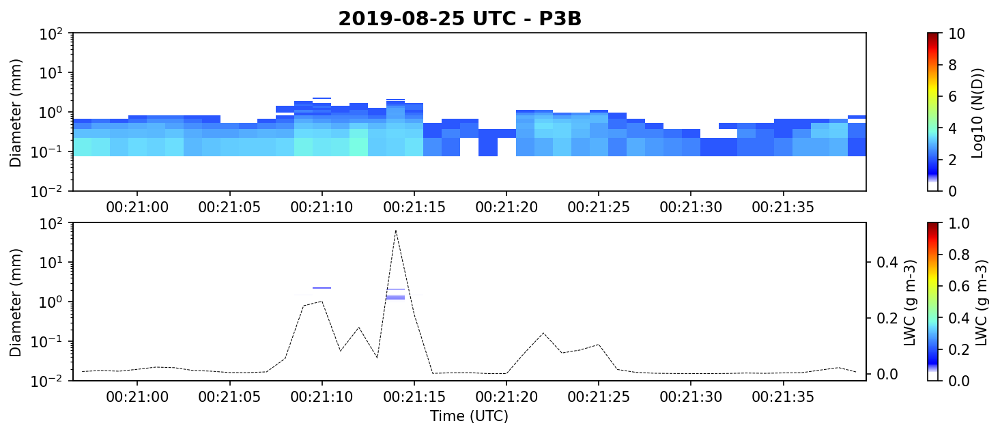

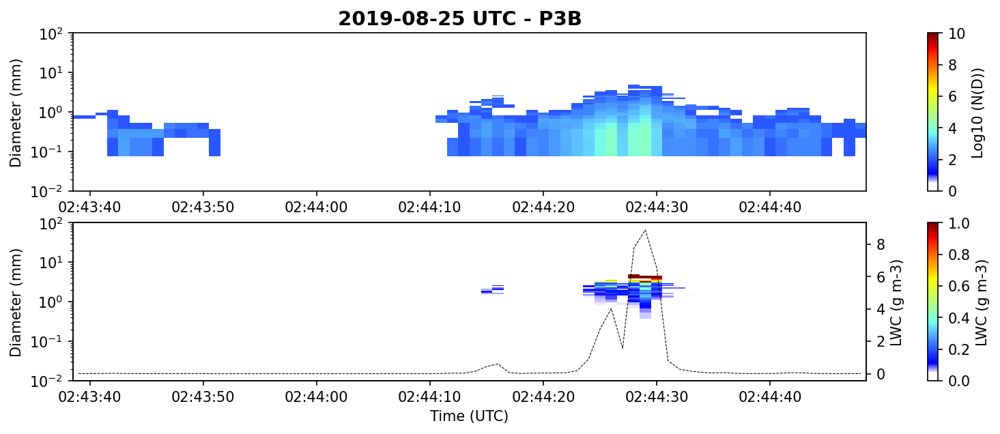

In [11]:
for i,j in zip(start[:2], end[:2]):
    event = xr_hvps.sel(time=slice(i, j))
    parms_res = pds_parameters(event)

    fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10, 4.5), dpi=150)
    
    cbar = ax0.pcolormesh(event.time.values, event.diameter / 1e3, 
                          np.log10(event.psd.T.values * 1e6), 
                          vmin=0, vmax=10, cmap=my_cmap, shading='nearest')
    
    
    cbar1 = ax1.pcolormesh(event.time.values, event.diameter / 1e3, 
                           parms_res.lwc.T, 
                          vmin=0, vmax=1, cmap=my_cmap, shading='nearest')

    ax11 = ax1.twinx()
    lwc_sum = parms_res.lwc.sum('diameter')    
    lwc_sum = lwc_sum.where(lwc_sum >= 0)
    ax11.plot(lwc_sum.time, lwc_sum, c='k', ls='--', lw=0.5)

    add_colorbar_outside(cbar1, ax1, 'LWC (g m-3)')
    add_colorbar_outside(cbar, ax0, 'Log10 (N(D))')
    ax1.set_xlabel('Time (UTC)')
    ax1.set_ylabel('Diameter (mm)')
    ax11.set_ylabel('LWC (g m-3)')
    ax0.set_ylabel('Diameter (mm)')
    
    title = f"{pd.to_datetime(event.time.values[0]): %Y-%m-%d} UTC - {aircraft}"
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)
    ax1.set_ylim(0.01, 100)
    ax0.set_ylim(0.01, 100)
    ax1.set_yscale('log')
    ax0.set_yscale('log')

    plt.show()

In [12]:
properties = pds_parameters(xr_hvps)

Text(0, 0.5, 'Counts')

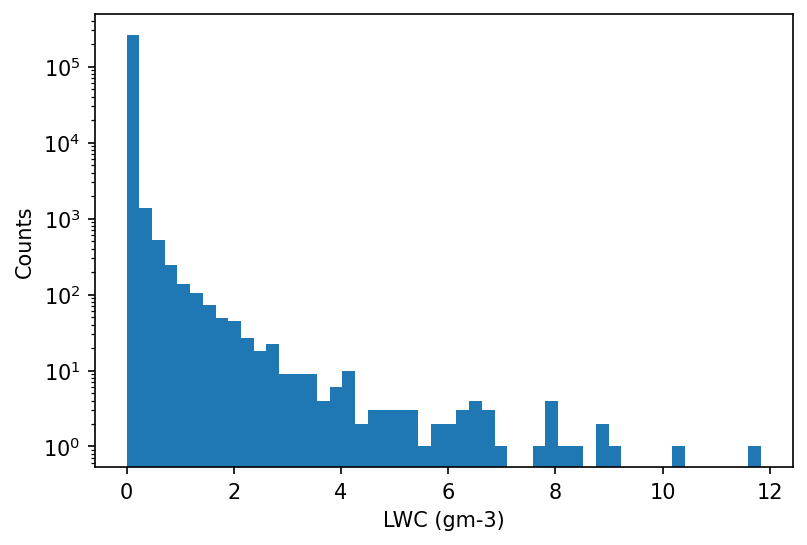

In [13]:
fig, ax = plt.subplots(dpi=150)
_ = ax.hist(properties.lwc_cum.where(properties.lwc_cum >= 0), bins=50)
ax.set_yscale('log')
ax.set_xlabel('LWC (gm-3)')
ax.set_ylabel('Counts')

In [14]:
properties.lwc_cum.where(properties.lwc_cum >= 8, drop=True).time

<xarray.DataArray 'time' (time: 8)>
array(['2019-08-25T02:44:29.000000000', '2019-08-25T05:03:37.000000000',
       '2019-08-30T22:49:07.000000000', '2019-08-30T22:49:11.000000000',
       '2019-08-30T22:49:14.000000000', '2019-08-30T22:49:23.000000000',
       '2019-09-17T01:52:19.000000000', '2019-09-17T01:52:23.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2019-08-25T02:44:29 ... 2019-09-17T01:52:23

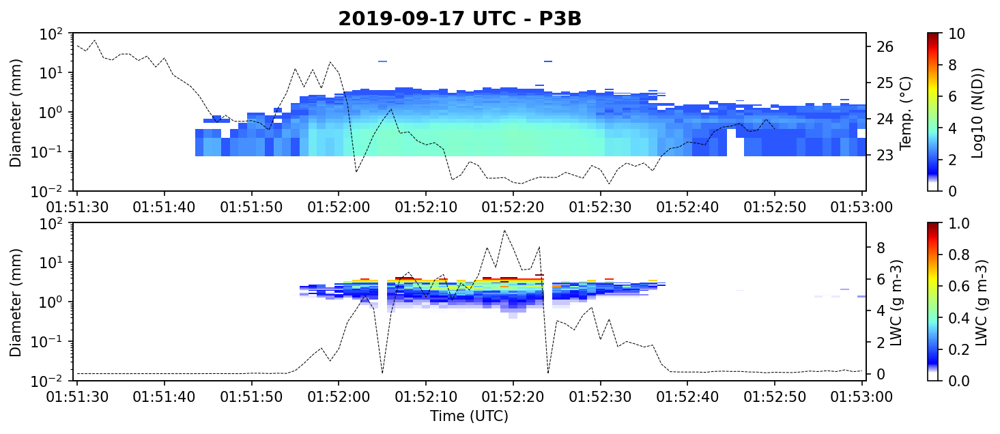

In [15]:
event = xr_hvps.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00'))

fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10, 4.5), dpi=150)

cbar = ax0.pcolormesh(event.time.values, event.diameter / 1e3, 
                      np.log10(event.psd.T.values * 1e6), 
                      vmin=0, vmax=10, cmap=my_cmap, shading='nearest')

ax00 = ax0.twinx()
ax00.plot(xr_hvps.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:52:50')).time, 
          xr_hvps.Temp.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:52:50')), 
          c='k', ls='--', lw=0.5)
ax00.set_ylabel('Temp. (°C)')
parms_res = pds_parameters(event)

cbar1 = ax1.pcolormesh(event.time.values, event.diameter / 1e3, 
                       parms_res.lwc.T, 
                      vmin=0, vmax=1, cmap=my_cmap, shading='nearest')

ax11 = ax1.twinx()
lwc_sum = parms_res.lwc.sum('diameter')    
lwc_sum = lwc_sum.where(lwc_sum >= 0)
ax11.plot(lwc_sum.time, lwc_sum, c='k', ls='--', lw=0.5)

add_colorbar_outside(cbar1, ax1, 'LWC (g m-3)')
add_colorbar_outside(cbar, ax0, 'Log10 (N(D))')
ax1.set_xlabel('Time (UTC)')
ax1.set_ylabel('Diameter (mm)')
ax11.set_ylabel('LWC (g m-3)')
ax0.set_ylabel('Diameter (mm)')

title = f"{pd.to_datetime(event.time.values[0]): %Y-%m-%d} UTC - {aircraft}"
fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)
ax1.set_ylim(0.01, 100)
ax0.set_ylim(0.01, 100)
ax1.set_yscale('log')
ax0.set_yscale('log')

plt.show()

In [33]:
def area_filter(ds):
    diameter= ds.diameter / 1e3
    and_xr = lambda d: 1.0048 + 0.0057 * d - 2.628 * d ** 2 + 3.682* d ** 3 - 1.677 * d ** 4 # diameter in cm
    axis_ratio = and_xr(diameter / 10)
    _area = lambda x: np.pi * (x / 2) ** 2
    area = _area(diameter) / 1e5 
    _lower = area * axis_ratio
    _upper = area * axis_ratio + area * axis_ratio * 2.0
    ds_area =  ds.a_bin /  ds.cnt_bin
    ds_area = ds_area.where(ds_area >= _lower).where(ds_area <= _upper)
    return ds_area.notnull(), area, _lower, _upper, axis_ratio

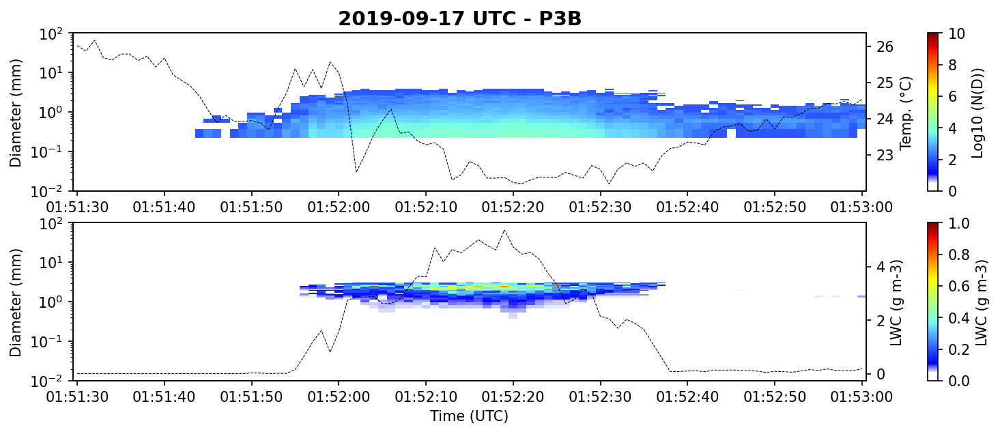

In [24]:
event = xr_hvps.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00')).sel(diameter=slice(300, 4000))

ds_filt, area, low, up, ar = area_filter(event)


fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10, 4.5), dpi=150)

cbar = ax0.pcolormesh(event.time.values, event.diameter / 1e3, 
                      np.log10(event.psd.T.values * 1e6), 
                      vmin=0, vmax=10, cmap=my_cmap, shading='nearest')

ax00 = ax0.twinx()
ax00.plot(xr_hvps.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00')).time, 
          xr_hvps.Temp.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00')), 
          c='k', ls='--', lw=0.5)
ax00.set_ylabel('Temp. (°C)')

event = event.where(ds_filt)

parms_res = pds_parameters(event)

cbar1 = ax1.pcolormesh(event.time.values, event.diameter / 1e3, 
                       parms_res.lwc.T, 
                      vmin=0, vmax=1, cmap=my_cmap, shading='nearest')

ax11 = ax1.twinx()
lwc_sum = parms_res.lwc.sum('diameter')    
lwc_sum = lwc_sum.where(lwc_sum >= 0)
ax11.plot(lwc_sum.time, lwc_sum, c='k', ls='--', lw=0.5)

add_colorbar_outside(cbar1, ax1, 'LWC (g m-3)')
add_colorbar_outside(cbar, ax0, 'Log10 (N(D))')
ax1.set_xlabel('Time (UTC)')
ax1.set_ylabel('Diameter (mm)')
ax11.set_ylabel('LWC (g m-3)')
ax0.set_ylabel('Diameter (mm)')

title = f"{pd.to_datetime(event.time.values[0]): %Y-%m-%d} UTC - {aircraft}"
fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)
ax1.set_ylim(0.01, 100)
ax0.set_ylim(0.01, 100)
ax1.set_yscale('log')
ax0.set_yscale('log')

plt.show()

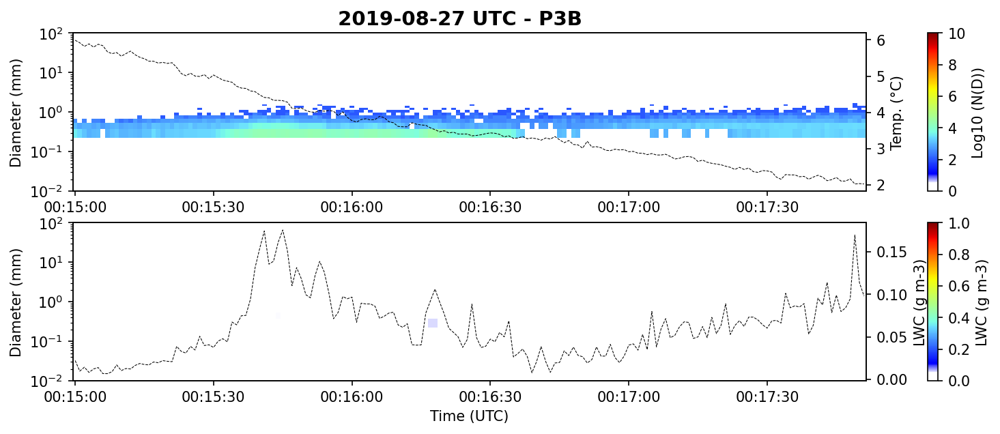

In [25]:
event = xr_hvps.sel(time=slice('2019-08-27 00:15', 
                               '2019-08-27 0:30')).sel(diameter=slice(300, 3000))
ds_filt, area, low, up, ar = area_filter(event)

event = event.where(ds_filt)
fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10, 4.5), dpi=150)

cbar = ax0.pcolormesh(event.time.values, event.diameter / 1e3, 
                      np.log10(event.psd.T.values * 1e6), 
                      vmin=0, vmax=10, cmap=my_cmap, shading='nearest')

ax00 = ax0.twinx()
ax00.plot(xr_hvps.sel(time=slice('2019-08-27 00:15', '2019-08-27 0:30')).time, 
          xr_hvps.Temp.sel(time=slice('2019-08-27 00:15', '2019-08-27 0:30')), 
          c='k', ls='--', lw=0.5)
ax00.set_ylabel('Temp. (°C)')
parms_res = pds_parameters(event)

cbar1 = ax1.pcolormesh(event.time.values, event.diameter / 1e3, 
                       parms_res.lwc.T, 
                      vmin=0, vmax=1, cmap=my_cmap, shading='nearest')

ax11 = ax1.twinx()
lwc_sum = parms_res.lwc.sum('diameter')    
lwc_sum = lwc_sum.where(lwc_sum >= 0)
ax11.plot(lwc_sum.time, lwc_sum, c='k', ls='--', lw=0.5)

add_colorbar_outside(cbar1, ax1, 'LWC (g m-3)')
add_colorbar_outside(cbar, ax0, 'Log10 (N(D))')
ax1.set_xlabel('Time (UTC)')
ax1.set_ylabel('Diameter (mm)')
ax11.set_ylabel('LWC (g m-3)')
ax0.set_ylabel('Diameter (mm)')

title = f"{pd.to_datetime(event.time.values[0]): %Y-%m-%d} UTC - {aircraft}"
fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)
ax1.set_ylim(0.01, 100)
ax0.set_ylim(0.01, 100)
ax1.set_yscale('log')
ax0.set_yscale('log')

plt.show()

Text(0, 0.5, 'Counts')

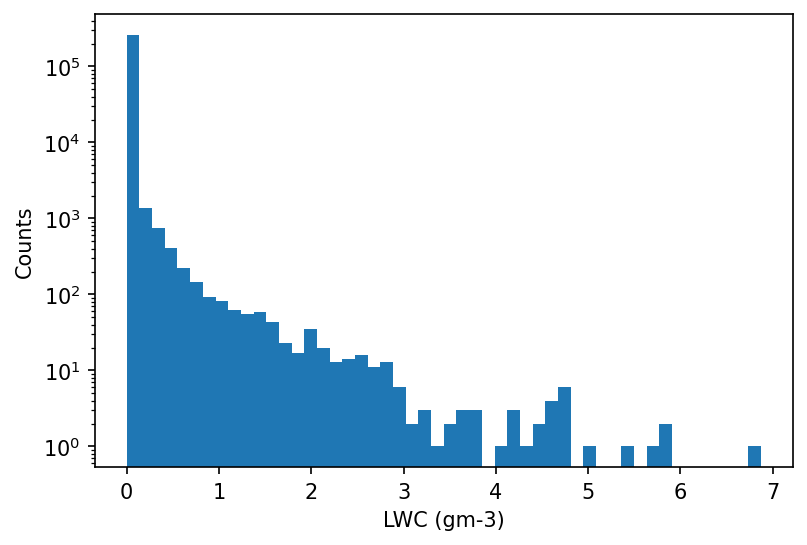

In [34]:
ds_filt, area, low, up, ar = area_filter(xr_hvps)
event = xr_hvps.where(ds_filt).sel(diameter=slice(300, 4000))
properties = pds_parameters(event)
fig, ax = plt.subplots(dpi=150)
_ = ax.hist(properties.lwc_cum.where(properties.lwc_cum >= 0), bins=50)
ax.set_yscale('log')
ax.set_xlabel('LWC (gm-3)')
ax.set_ylabel('Counts')

In [27]:
properties.time.where(properties.lwc_cum > 5, drop=True).compute()

<xarray.DataArray 'time' (time: 6)>
array(['2019-08-25T05:03:33.000000000', '2019-08-25T05:03:36.000000000',
       '2019-08-25T05:03:37.000000000', '2019-08-25T05:03:38.000000000',
       '2019-09-17T01:52:16.000000000', '2019-09-17T01:52:19.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2019-08-25T05:03:33 ... 2019-09-17T01:52:19

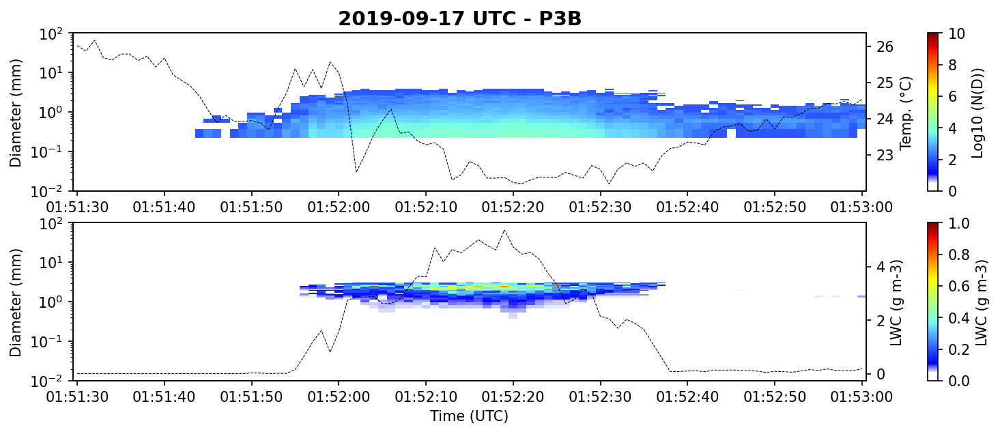

In [39]:
event = xr_hvps.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00')).sel(diameter=slice(300, 4000))
ds_filt, area, low, up, ar = area_filter(event)


fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10, 4.5), dpi=150)

cbar = ax0.pcolormesh(event.time.values, event.diameter / 1e3, 
                      np.log10(event.psd.T.values * 1e6), 
                      vmin=0, vmax=10, cmap=my_cmap, shading='nearest')

ax00 = ax0.twinx()
ax00.plot(xr_hvps.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00')).time, 
          xr_hvps.Temp.sel(time=slice('2019-09-17 01:51:30', '2019-09-17 01:53:00')), 
          c='k', ls='--', lw=0.5)
ax00.set_ylabel('Temp. (°C)')

parms_res = pds_parameters(event.where(ds_filt))

cbar1 = ax1.pcolormesh(event.time.values, event.diameter / 1e3, 
                       parms_res.lwc.T, 
                      vmin=0, vmax=1, cmap=my_cmap, shading='nearest')

ax11 = ax1.twinx()
lwc_sum = parms_res.lwc.sum('diameter')    
lwc_sum = lwc_sum.where(lwc_sum >= 0)
ax11.plot(lwc_sum.time, lwc_sum, c='k', ls='--', lw=0.5)

add_colorbar_outside(cbar1, ax1, 'LWC (g m-3)')
add_colorbar_outside(cbar, ax0, 'Log10 (N(D))')
ax1.set_xlabel('Time (UTC)')
ax1.set_ylabel('Diameter (mm)')
ax11.set_ylabel('LWC (g m-3)')
ax0.set_ylabel('Diameter (mm)')

title = f"{pd.to_datetime(event.time.values[0]): %Y-%m-%d} UTC - {aircraft}"
fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)
ax1.set_ylim(0.01, 100)
ax0.set_ylim(0.01, 100)
ax1.set_yscale('log')
ax0.set_yscale('log')

plt.show()

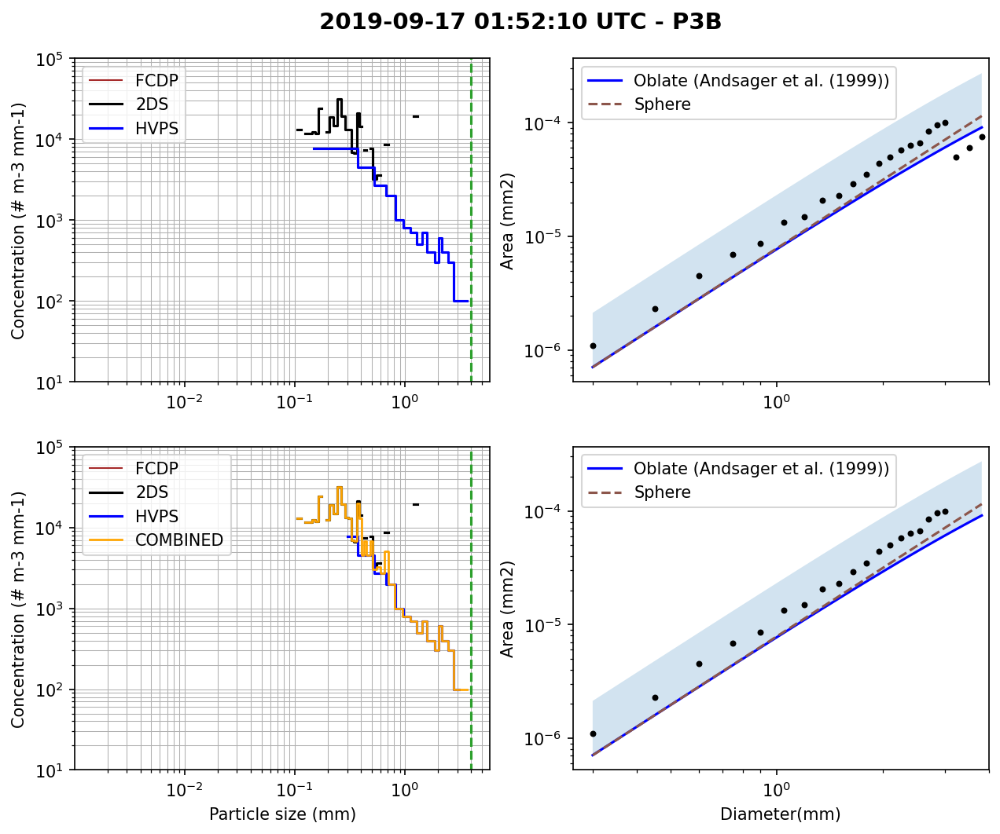

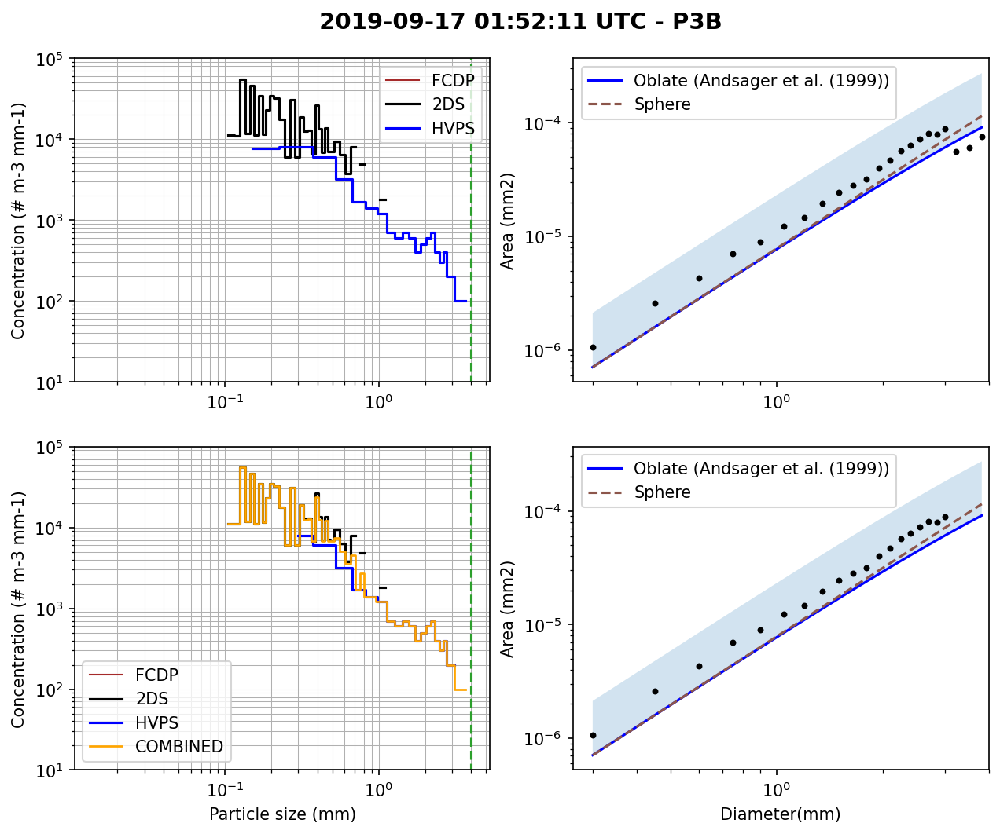

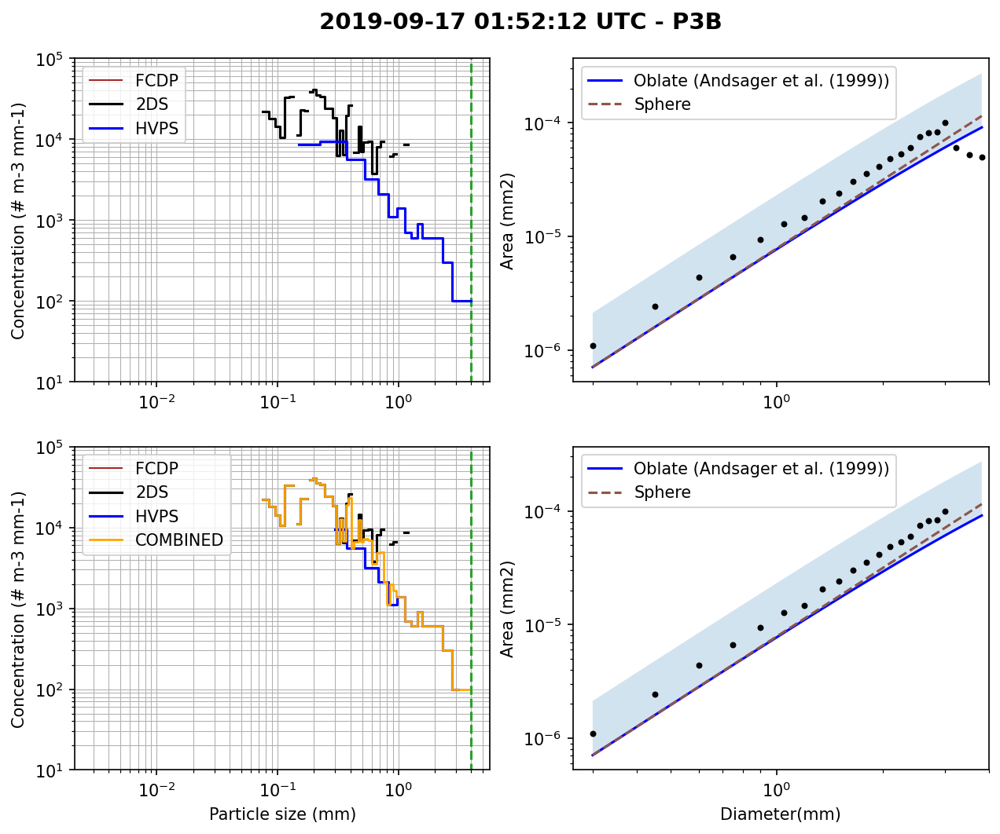

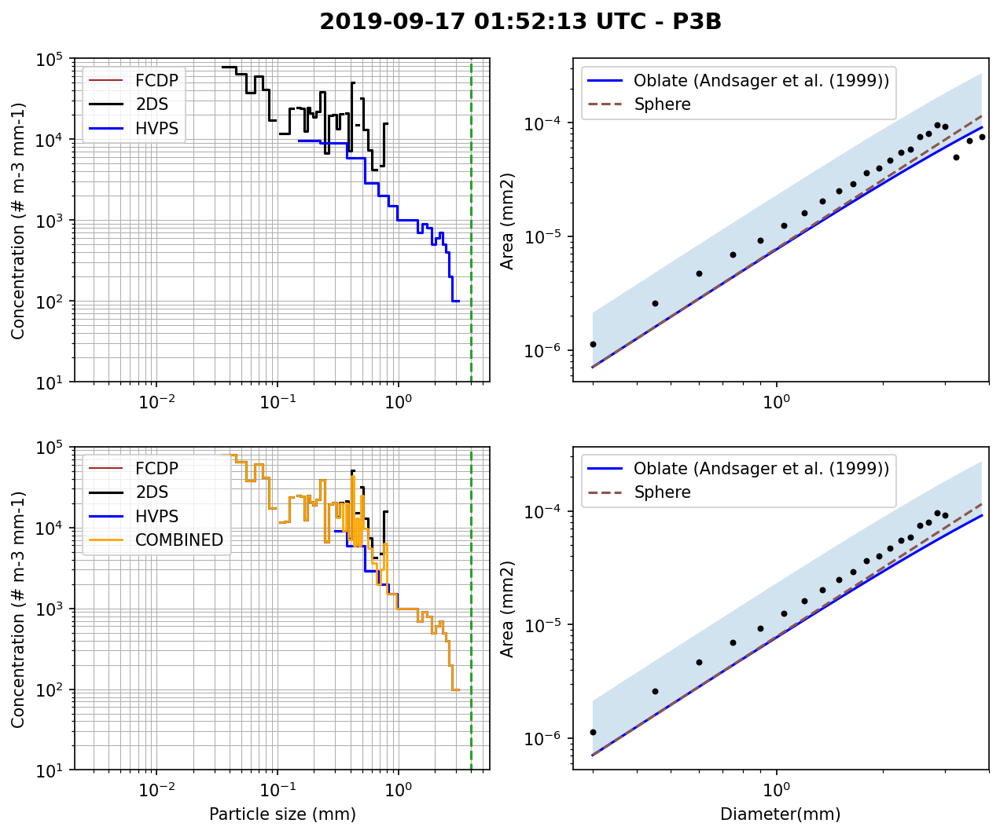

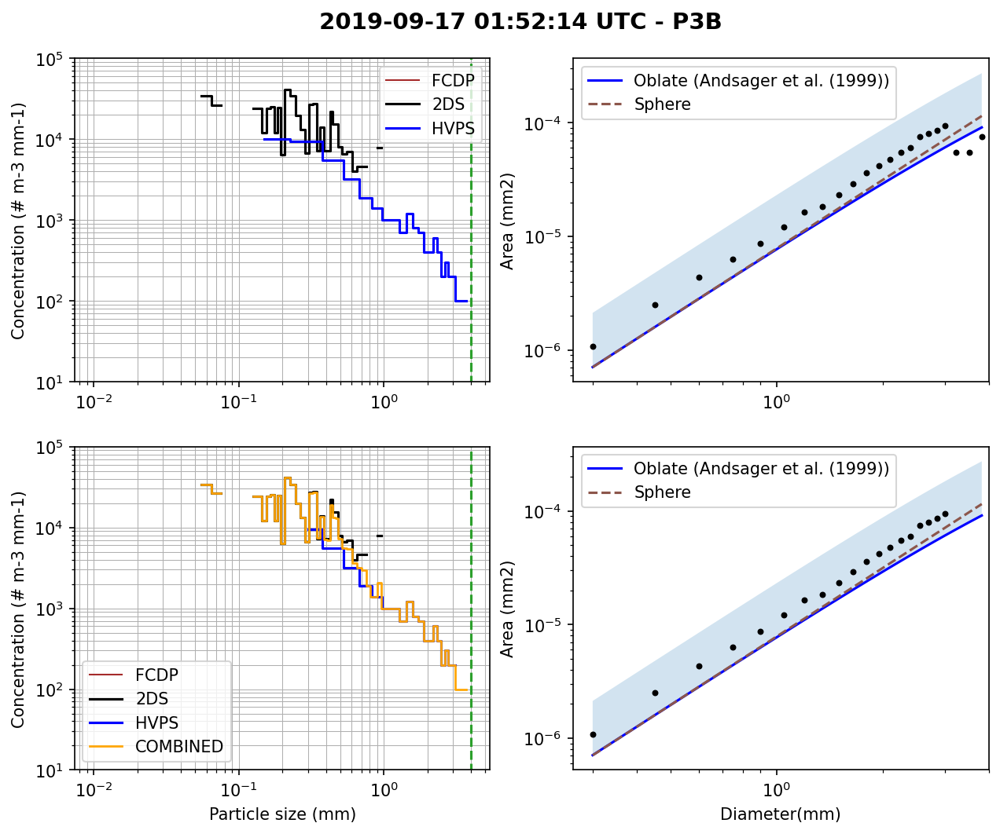

...

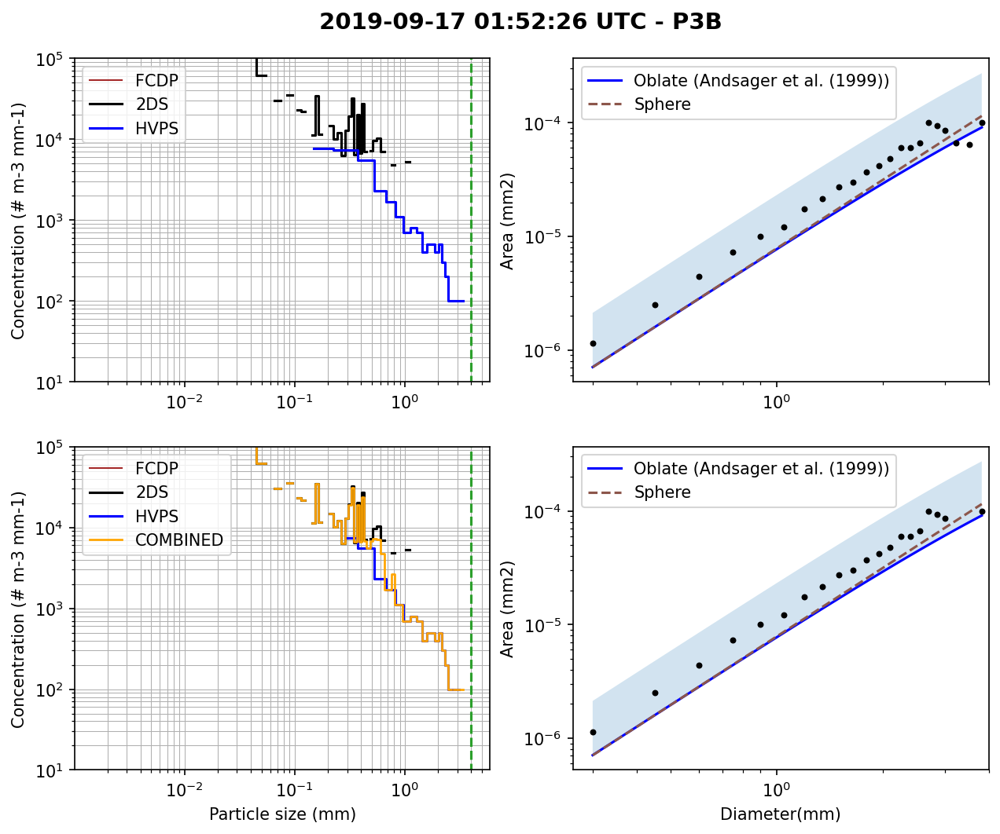

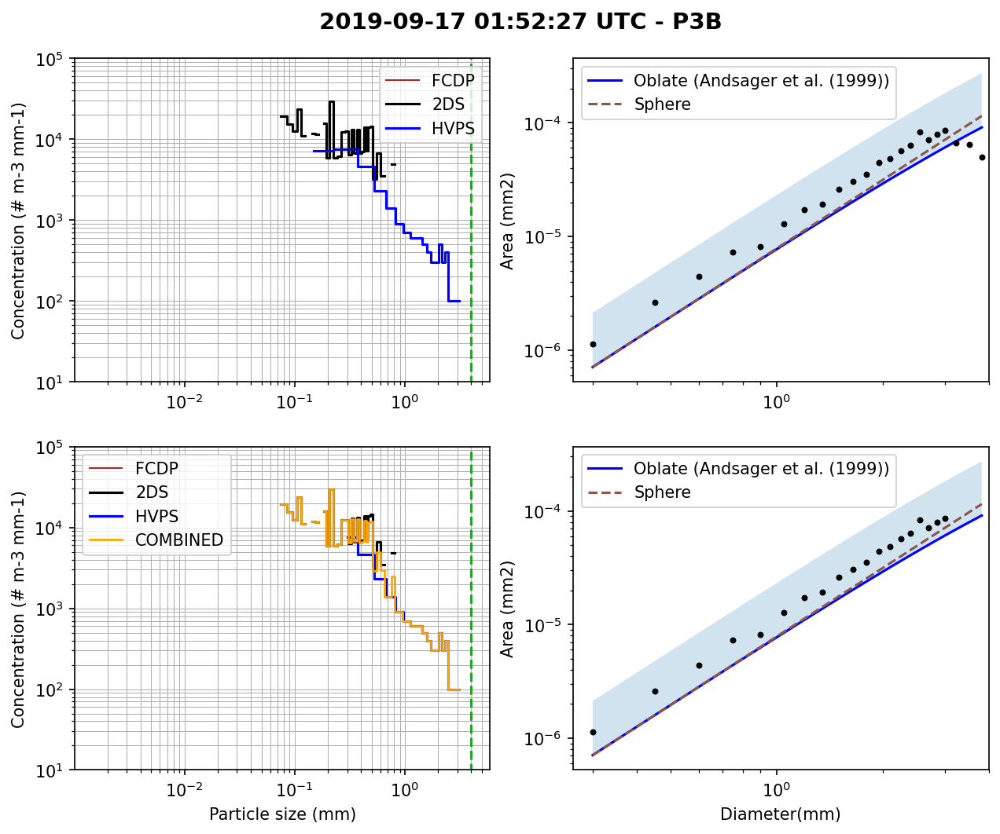

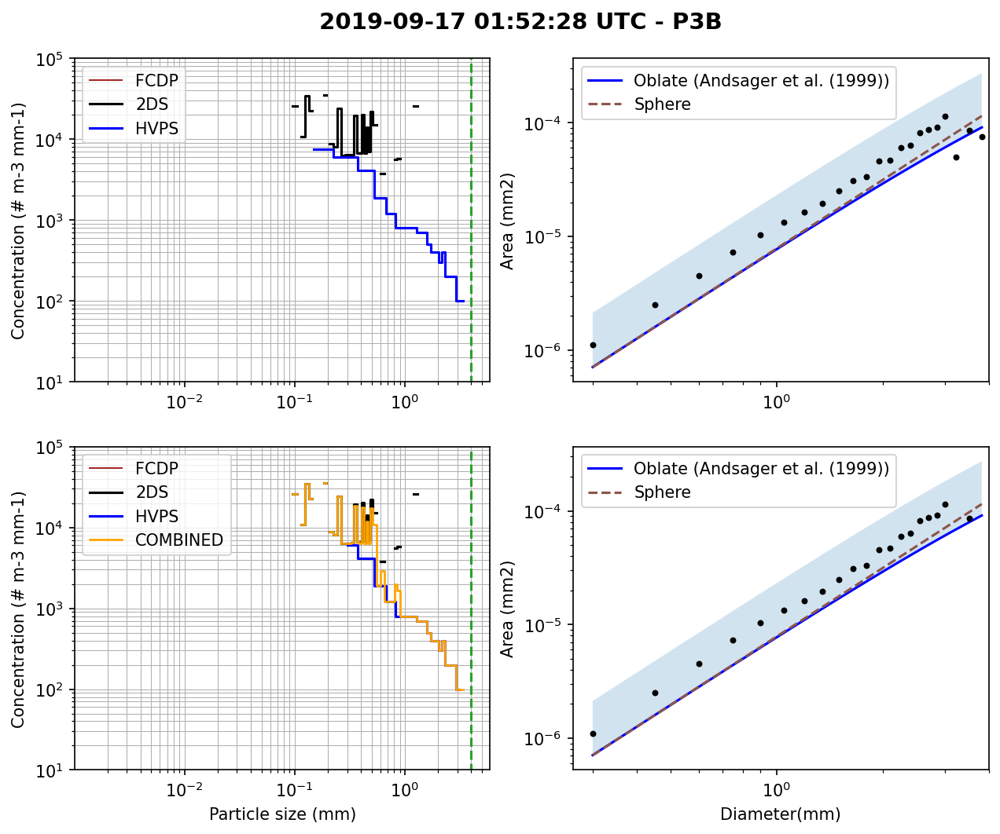

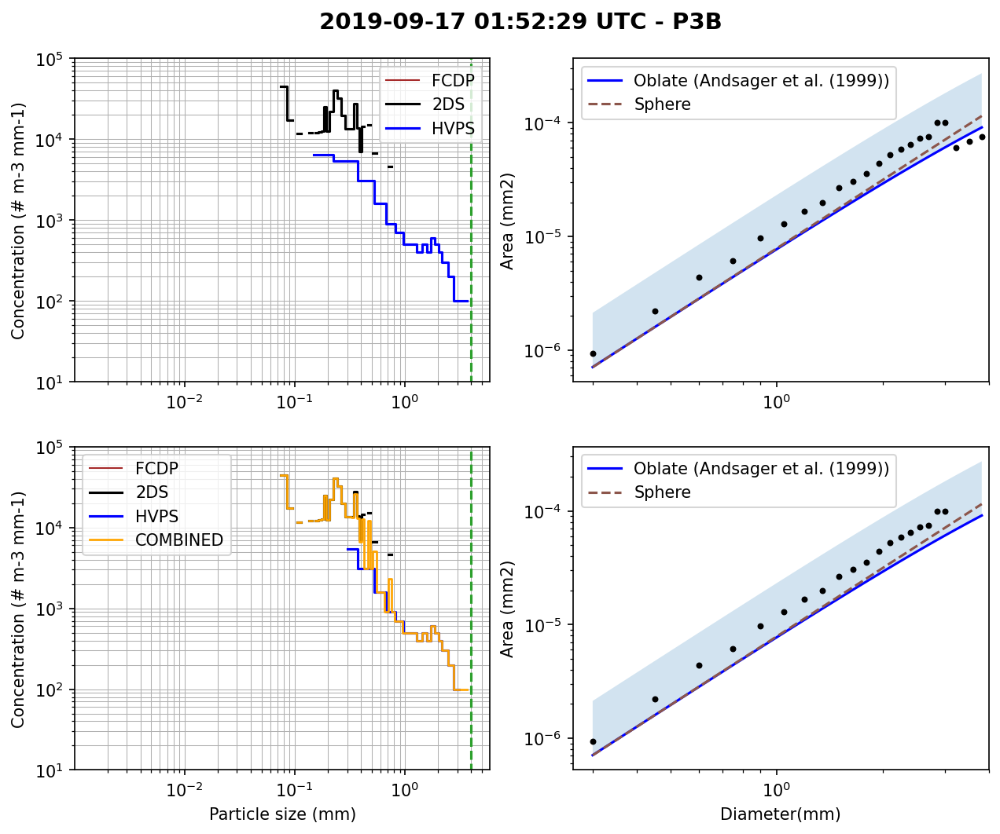

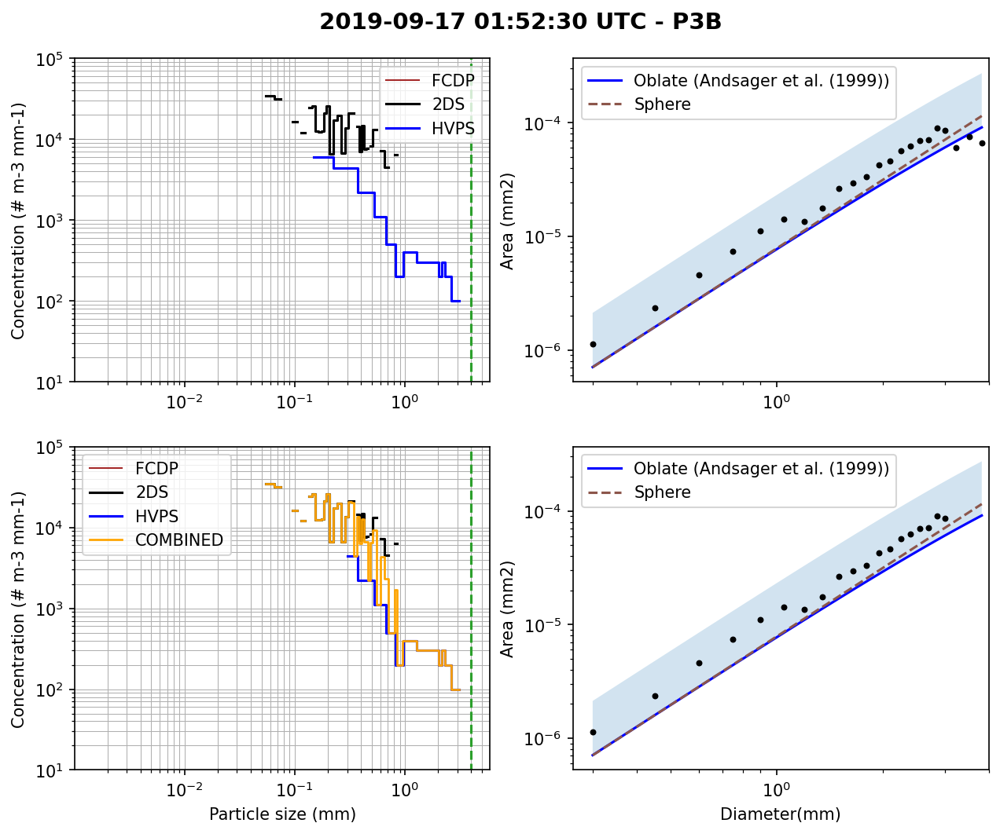

In [45]:
ds = event.sel(time=slice('2019-09-17 01:52:10', '2019-09-17 01:52:30'))
for i in ds.time:
    
    fig, ax = plt.subplots(2, 2, figsize=(10, 8), dpi=150)
    y = xr_fcdp.psd.sel(time=i) * 1e6
    y = y.where(y > 0, np.nan)
    ax[0][0].step(x=xr_fcdp.diameter * 1e-3, y=y, where='mid', c='brown', lw=1, label= 'FCDP')
    
    y = xr_2ds.psd.sel(time=i) * 1e6
    y = y.where(y > 0, np.nan)
    ax[0][0].step(x=xr_2ds.diameter * 1e-3, y=y, where='mid', label='2DS', c='k')

    y = xr_hvps.psd.sel(time=i) * 1e6
    y = y.where(y > 0, np.nan)
    ax[0][0].step(x=xr_hvps.diameter* 1e-3, y=y, where='mid', label='HVPS', c='b')
    
    
    ax[0][0].vlines(x=4000 * 1e-3, ymin=1e0, ymax=1e12, colors='C2', linestyles='dashed')
    
    ax[0][0].set_yscale('log')
    ax[0][0].set_xscale('log')
    ax[0][0].grid(which='both', lw=0.5)
    ax[0][0].set_ylabel('N(d) (# mm-1 m-3)')
    ax[0][0].set_ylim(1e1, 1e5)
    ax[0][0].legend()
    
    ax[0][1].plot(ds.diameter / 1e3, area * ar, c='b', label='Oblate (Andsager et al. (1999))')
    ax[0][1].plot(ds.diameter / 1e3, area,  color='tab:brown', ls='--', label='Sphere')
    
    ax[0][1].scatter(ds.diameter / 1e3, ds.a_bin.sel(time=i) /  ds.cnt_bin.sel(time=i), 
               zorder=2.5, c='k', lw=0.8, marker='.')
    ax[0][1].fill_between(ds.diameter / 1e3 , 
                low, 
                up, alpha=0.2)
    
    ax[0][1].set_xscale('log')
    ax[0][1].set_yscale('log')
    ax[0][1].set_ylabel('Area (mm2)')
    ax[0][1].set_xlim(0, 4)
    ax[0][1].legend()
    
    
    y = xr_fcdp.psd.sel(time=i) * 1e6
    y = y.where(y > 0, np.nan)

    ax[1][0].step(x=xr_fcdp.diameter * 1e-3, y=y, where='mid', c='brown', lw=1, label= 'FCDP')
    
    y = xr_2ds.psd.sel(time=i) * 1e6
    y = y.where(y > 0, np.nan)

    ax[1][0].step(x=xr_2ds.diameter * 1e-3, y=y, where='mid', label='2DS', c='k')

    y = ds.psd.where(ds_filt).sel(time=i) * 1e6
    y = y.where(y > 0, np.nan)
    ax[1][0].step(x=ds.diameter* 1e-3, y=y, where='mid', label='HVPS', c='b')
    
#     try:
    y = xr_comb_350.psd.sel(time=i)
    y = y.where(y > 0, np.nan) * 1e6
    ax[1][0].step(x=xr_comb_350.diameter * 1e-3, y=y, where='mid', label='COMBINED', c='orange', lw=1.3)
#     except (KeyError, NameError):
#         pass
    
    ax[1][0].vlines(x=4000 * 1e-3, ymin=1e0, ymax=1e12, colors='C2', linestyles='dashed')
    
    ax[1][0].set_yscale('log')
    ax[1][0].set_xscale('log')
    ax[1][0].set_ylim(1e1, 1e5)
    ax[1][0].grid(which='both', lw=0.5)
    ax[1][0].legend()


    ax[1][0].set_xlabel('Particle size (mm)')
    
    ax[1][1].plot(ds.diameter/1e3, area * ar, c='b', label='Oblate (Andsager et al. (1999))')
    ax[1][1].plot(ds.diameter /1e3, area,  color='tab:brown', ls='--', label='Sphere')
    
    ds_ar = ds.a_bin.sel(time=i) /  ds.cnt_bin.sel(time=i)
    ax[1][1].scatter(ds.diameter / 1e3, ds_ar.where(ds_filt.sel(time=i)), 
               zorder=2.5, c='k', lw=0.8, marker='.')
    ax[1][1].fill_between(ds.diameter/1e3, 
                          low, up, alpha=0.2)
    ax[1][1].set_xscale('log')
    ax[1][1].set_yscale('log')
    ax[1][1].set_ylabel('Area (mm2)')
    ax[1][1].set_xlim(0, 4)
    ax[1][1].set_xlabel('Diameter(mm)')
    ax[1][1].legend()
    title = f"{pd.to_datetime(i.values): %Y-%m-%d %X} UTC - {aircraft}"
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.99)
    
    
    title = f"{pd.to_datetime(i.values): %Y-%m-%d %X} UTC - {aircraft}"
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)
    ax[0][0].set_ylabel('Concentration (# m-3 mm-1)')
    ax[0][0].grid(which='both')

    ax[1][1].set_xlabel('Diameter(mm)')
    ax[1][0].set_ylabel('Concentration (# m-3 mm-1)')
    ax[0][0].grid(which='both', lw=0.5)
    plt.show()